<a href="https://colab.research.google.com/github/MandarPateOP/Netflix-Movies-and-TV-Shows-Clustering/blob/main/Netflix_Movies_and_TV_Shows_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Netflix Movies and TV Shows Clustering



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual


# **Project Summary -**

The goal of this project is to analyze the **Netflix catalog of movies and TV shows**, which was sourced from the third-party search engine Flixable, and group them into relevant clusters. This will aid in enhancing the user experience and prevent subscriber churn for the world's largest online streaming service provider, Netflix, which currently boasts over 220 million subscribers as of 2022-Q2. The dataset, which includes movies and TV shows as of 2019, will be analyzed to uncover new insights and trends in the rapidly growing world of streaming entertainment

# **GitHub Link -**

https://github.com/MandarPateOP/Netflix-Movies-and-TV-Shows-Clustering

# **Problem Statement**


Netflix is a streaming service that offers a wide variety of television shows and movies for viewers to watch at their convenience. With a monthly subscription, users have access to a vast library of content, including original series and films produced by Netflix. The platform also allows users to create multiple profiles, making it easy for family members or roommates to have their own personalized viewing experience. Additionally, Netflix allows users to download content to watch offline, making it a great option for those who travel frequently or have limited internet access. Overall, Netflix is a convenient and cost-effective way to access a wide variety of entertainment.

As of 2022-Q2, more than 220 million people had signed up for Netflix's online streaming service, making it the largest OTT provider worldwide. To improve the user experience and prevent subscriber churn, they must efficiently cluster the shows hosted on their platform.

By creating clusters, we will be able to comprehend the shows that are alike and different from one another. These clusters can be used to provide customers with individualized show recommendations based on their preferences.

This project aims to classify and group Netflix shows into specific clusters in such a way that shows in the same cluster are similar to one another and shows in different clusters are different.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [129]:
# Importing basic Libraries
import pandas  as pd
import numpy as np
import seaborn as sns
import datetime as datetime
import matplotlib.pyplot as plt  
%matplotlib inline

#Libraries for importing from google drive
from google.colab import drive
drive.mount('/content/drive')

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

#Warnings 
import warnings
warnings.filterwarnings('ignore')

# libraries used to process textual data
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# libraries used to implement clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Dataset Loading

In [130]:
# Load Dataset
df=pd.read_csv('/content/drive/My Drive/Capstone Project 4 - Netflix Movies and TV Shows Clustering/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv',encoding = "ISO-8859-1",parse_dates=True)


### Dataset First View

In [131]:
# Dataset First Look
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"JoÃ£o Miguel, Bianca Comparato, Michel Gomes, ...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"DemiÃ¡n Bichir, HÃ©ctor Bonilla, Oscar Serrano...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [132]:
df.sample(10)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
2370,s2371,Movie,Generation Iron 2,Vlad Yudin,NaN,United States,"October 1, 2017",2017,PG-13,107 min,"Documentaries, Sports Movies",New-generation bodybuilding stars â includin...
6571,s6572,Movie,The Last Thing He Wanted,Dee Rees,"Anne Hathaway, Ben Affleck, Willem Dafoe, Toby...",United States,"February 21, 2020",2020,R,116 min,"Dramas, Thrillers",A hard-hitting reporter becomes entangled in t...
7094,s7095,Movie,Time Please,Sameer Vidwans,"Priya Bapat, Siddarth Jadhav, Umesh Kamat, Sai...",India,"January 1, 2018",2013,TV-14,125 min,"Comedies, Dramas, International Movies","Personality differences, an old friend and a p..."
3225,s3226,Movie,Joy,Sudabeh Mortezai,"Anwulika Alphonsus, Mariam Precious Sanusi, An...",Austria,"May 24, 2019",2019,TV-MA,101 min,"Dramas, Independent Movies, International Movies","Close to paying off her debts, a Nigerian sex ..."
3846,s3847,Movie,Made in China,Mikhil Musale,"Rajkummar Rao, Boman Irani, Mouni Roy, Sumeet ...",India,"January 12, 2020",2019,TV-MA,128 min,"Comedies, Dramas, International Movies","After a trip to China, a struggling entreprene..."
4348,s4349,TV Show,My Pride,NaN,"Khaled Amin, Elham Al Fadalah, Fatima Al Safi,...",NaN,"March 15, 2019",2018,TV-14,1 Season,"International TV Shows, TV Dramas","After their mother's death, Amal and her broth..."
1278,s1279,TV Show,CharitÃ© at War,NaN,"Mala Emde, Ulrich Noethen, Jannik SchÃ¼mann, A...",NaN,"June 15, 2019",2019,TV-MA,1 Season,"International TV Shows, TV Dramas","In 1943, the staff at Berlin's CharitÃ© hospit..."
4601,s4602,TV Show,Oktoberfest: Beer & Blood,NaN,"MiÅ¡el MatiÄeviÄ, Martina Gedeck, Klaus Stei...","Germany, Czech Republic","October 1, 2020",2020,TV-MA,1 Season,"International TV Shows, TV Dramas","In 1900 Munich, ambitious brewer Curt Prank us..."
675,s676,Movie,Back of the Net,Louise Alston,"Sofia Wylie, Tiarnie Coupland, Trae Robin, Gem...",Australia,"December 21, 2019",2019,TV-Y,86 min,"Children & Family Movies, Sports Movies",An American science geek ready to spend a summ...
1958,s1959,Movie,El lÃ­mite infinito,Pablo Aulita,Jean Maggi,NaN,"June 18, 2020",2020,TV-PG,48 min,"Documentaries, International Movies, Sports Mo...",From early struggles to his climb up the Himal...


### Dataset Rows & Columns count

In [133]:
# Dataset Rows & Columns count
df.shape

(7787, 12)

### Dataset Information

In [134]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [135]:
# Dataset Duplicate Value Count
#No duplicate rows
df.duplicated().sum()

0

#### Missing Values/Null Values

In [136]:
# Missing Values/Null Values Count
df.isnull().sum().sort_values(ascending=False)

director        2389
cast             718
country          507
date_added        10
rating             7
show_id            0
type               0
title              0
release_year       0
duration           0
listed_in          0
description        0
dtype: int64

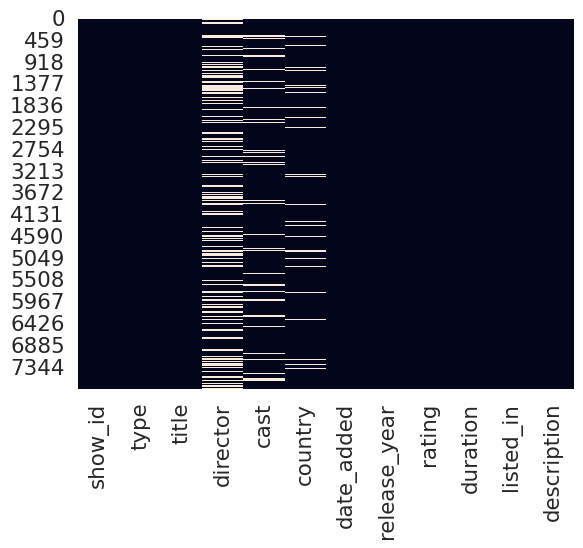

In [137]:
# Visualizing the missing values by plotting heatmap
sns.heatmap(df.isnull(), cbar=False);

In [138]:
missing_percentage=round(df.isnull().sum().sort_values(ascending=False)/len(df),3)*100
missing_percentage

director        30.7
cast             9.2
country          6.5
date_added       0.1
rating           0.1
show_id          0.0
type             0.0
title            0.0
release_year     0.0
duration         0.0
listed_in        0.0
description      0.0
dtype: float64

<Axes: >

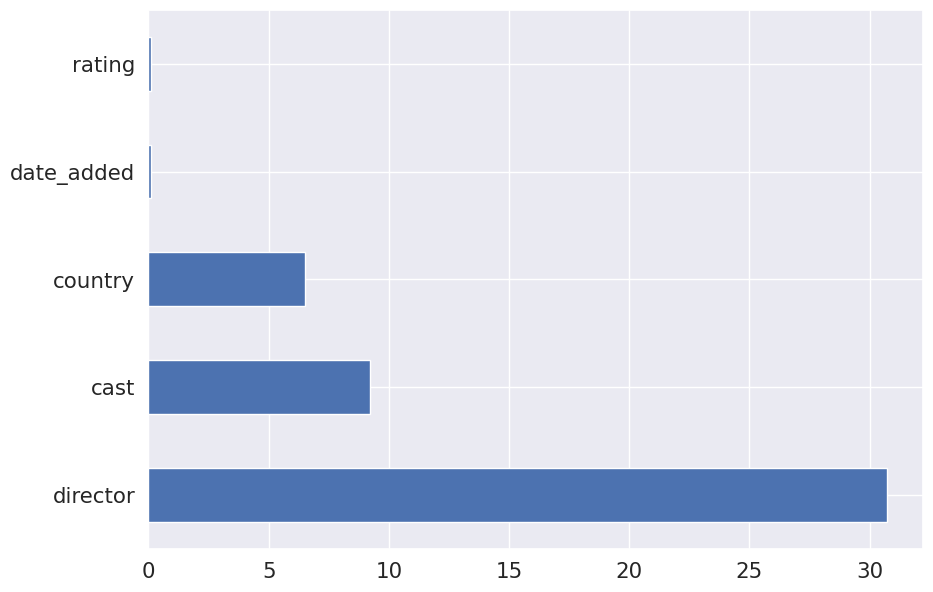

In [242]:
missing_percentage[missing_percentage!=0].plot(kind='barh',figsize=(10,7))

### What did you know about your dataset?

1) Dataset having  **No duplicate** rows present.

2) There are **7787 rows** and **12 columns** in the dataset.

3) In the director, cast, country, date_added, and rating columns, there are missing values.

4) date_added feature should be in datetime type


## ***2. Understanding Your Variables***

In [140]:
# Dataset Columns
print(list(df.columns))

['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 'release_year', 'rating', 'duration', 'listed_in', 'description']


In [141]:
# Dataset Describe
df.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


In [142]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
show_id,7787,7787,s1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type,7787,2,Movie,5377,NaN,NaN,NaN,NaN,NaN,NaN,NaN
title,7787,7787,3%,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
director,5398,4049,"RaÃºl Campos, Jan Suter",18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cast,7069,6831,David Attenborough,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
country,7280,681,United States,2555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
date_added,7777,1565,"January 1, 2020",118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
release_year,7787.0,NaN,NaN,NaN,2013.93258,8.757395,1925.0,2013.0,2017.0,2018.0,2021.0
rating,7780,14,TV-MA,2863,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration,7787,216,1 Season,1608,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Variables Description 

1) **show_id** : Unique ID for every Movie/Show

2) **type** : Identifier - Movie/Show

3) **title** : Title of the Movie/Show

4) **director** : Director of the Movie/Show

5) **cast** : Actors involved in the Movie/Show

6) **country** : Country where the Movie/Show was produced

7) **date_added** : Date it was added on Netflix

8) **release_year** : Actual Release year of the Movie/Show

9) **rating** : TV Rating of the Movie/Show

10) **duration** : Total Duration - in minutes or number of seasons

11) **listed_in** : Genre

12) description : The Summary description

### Check Unique Values for each variable.

In [143]:
# Check Unique Values for each variable.
num_cols = df.select_dtypes(include='number')
for col in num_cols:
    print(f"{col} has '{num_cols[col].nunique()}' unique values")

cat_cols = df.select_dtypes(exclude='number')
for col in cat_cols:
    print(f"{col} has '{cat_cols[col].nunique()}' unique values")

release_year has '73' unique values
show_id has '7787' unique values
type has '2' unique values
title has '7787' unique values
director has '4049' unique values
cast has '6831' unique values
country has '681' unique values
date_added has '1565' unique values
rating has '14' unique values
duration has '216' unique values
listed_in has '492' unique values
description has '7769' unique values


In [144]:
#lets check for release_year 
df['release_year'].unique()

#Netflix having content from 1925 to 2021 

array([2020, 2016, 2011, 2009, 2008, 2019, 1997, 2017, 2018, 2014, 2015,
       2010, 2005, 2013, 2012, 2006, 2000, 2003, 1989, 2004, 1977, 1971,
       1993, 2007, 1998, 1988, 1996, 2002, 1986, 1990, 1979, 1980, 1974,
       2001, 1999, 1966, 1991, 1982, 1994, 1995, 1978, 1992, 1972, 1975,
       2021, 1973, 1967, 1960, 1981, 1958, 1976, 1968, 1956, 1985, 1965,
       1984, 1983, 1987, 1945, 1946, 1962, 1925, 1942, 1969, 1955, 1963,
       1964, 1954, 1970, 1944, 1947, 1959, 1943])

## 3. ***Data Wrangling***

### Data Wrangling Code

In [145]:
# Write your code to make your dataset analysis ready.
df['date_added'] = pd.to_datetime(df['date_added']) #Converted to datetime
df['Month'] = df['date_added'].dt.month_name()      #extracting month feature from date_added
df.head(1)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,Month
0,s1,TV Show,3%,NaN,"JoÃ£o Miguel, Bianca Comparato, Michel Gomes, ...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,August


In [146]:
#We will drop show_id, date_added , rating as it is not giving such importance to out dataset
df.drop(columns=['show_id'],inplace=True)
df.dropna(subset=['date_added','rating'],inplace=True)
df.head(1)

,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,Month
0,TV Show,3%,NaN,"JoÃ£o Miguel, Bianca Comparato, Michel Gomes, ...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,August


In [147]:
#as we know almost 1/3rd of values in director are misssing and we cant fill it with anything so we will drop the feature itself
df.drop(columns=['director'],inplace=True)
df.head(1)

,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,Month
0,TV Show,3%,"JoÃ£o Miguel, Bianca Comparato, Michel Gomes, ...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,August


In [148]:
df.isnull().sum()

type              0
title             0
cast            718
country         505
date_added        0
release_year      0
rating            0
duration          0
listed_in         0
description       0
Month             0
dtype: int64

In [149]:
df['Month'].fillna(method='backfill',inplace=True)
df['cast'].fillna(value='No cast',inplace=True)
df['country'].fillna(value=df['country'].mode()[0],inplace=True)

In [150]:
df.isnull().sum()

type            0
title           0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
Month           0
dtype: int64

### What all manipulations have you done and insights you found?

1) Extracted new feature **Month** from date_added column.

2) Dropped show_id, director, rating from dataset.

3) Filled NA values in cast and country.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1(Type)

<Axes: ylabel='type'>

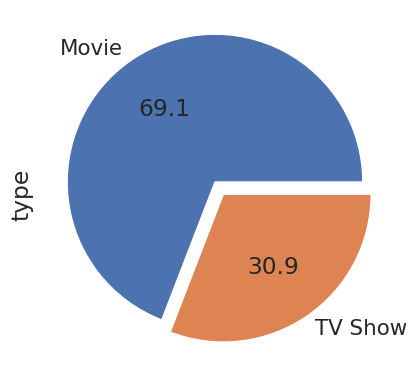

In [151]:
# Chart - 1 visualization code
myexplode = [0.1, 0]
df['type'].value_counts().plot(kind='pie',autopct='%.1f',explode=myexplode)

##### 1. Why did you pick the specific chart?

To check percentage of TV shows and Movies present in dataset.

##### 2. What is/are the insight(s) found from the chart?

Netflix having 30.9% of TV Shows and 69.1% of Movies on its platform

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 2(Movies v/s Ratings)

In [152]:
# Chart - 2 visualization code
df['rating'].unique()

array(['TV-MA', 'R', 'PG-13', 'TV-14', 'TV-PG', 'NR', 'TV-G', 'TV-Y',
       'TV-Y7', 'PG', 'G', 'NC-17', 'TV-Y7-FV', 'UR'], dtype=object)

In [153]:
#Assigning the Ratings into grouped categories(Adults,Teens,Older Kids, Kids)

ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
df['target_ages'] = df['rating'].replace(ratings)

In [154]:
# Making separate dataframe of Tv Shows and Movies from existing for future use

tv_shows=df[df['type']=='TV Show'] 
movies=df[df['type']=='Movie']

<Axes: title={'center': 'Movie ratings'}, xlabel='rating', ylabel='count'>

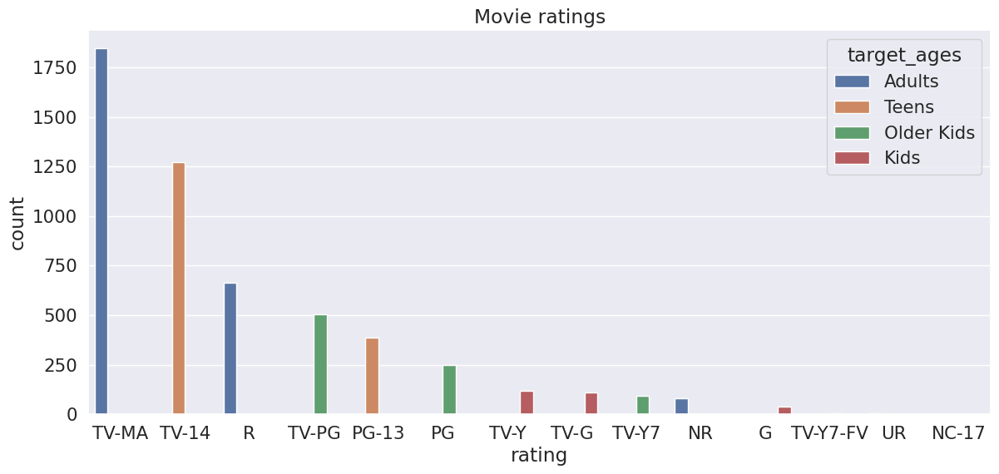

In [155]:
# Movie Ratings based on Target Age Groups

plt.figure(figsize=(14,6))
plt.title('Movie ratings')
sns.countplot(x=movies['rating'],hue=movies['target_ages'],data=movies,order=movies['rating'].value_counts().index)

##### 1. Why did you pick the specific chart?

To check which type of Ratings are there for Movies

##### 2. What is/are the insight(s) found from the chart?

Most of the ratings for **Adults** and **Teens** movies 

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 3(TV Shows v/s Ratings)

<Axes: title={'center': 'TV Shows ratings'}, xlabel='rating', ylabel='count'>

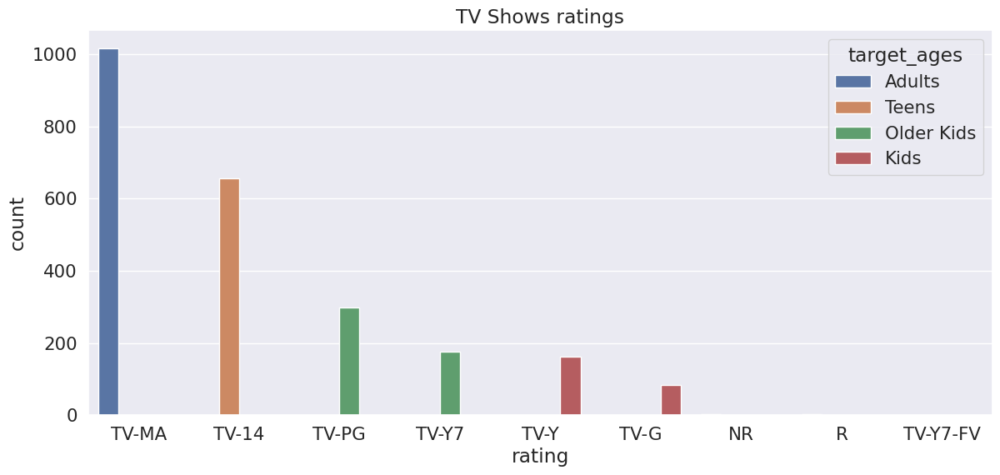

In [156]:
#TV Shows Ratings based on Target Age Groups

plt.figure(figsize=(14,6))
plt.title('TV Shows ratings')
sns.countplot(x=tv_shows['rating'],hue=tv_shows['target_ages'],data=tv_shows,order=tv_shows['rating'].value_counts().index)

##### 1. Why did you pick the specific chart?

To check TV Shows ratings based on target_ages

##### 2. What is/are the insight(s) found from the chart?

TV Shows are also mostly rated for **Adults** and **Teens**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 4(Production growths of tvshows and movies)

In [157]:
# getting Yearwise count of Movies and TV Shows for plotting
movies_year =movies['release_year'].value_counts().sort_index(ascending=False)
tvshows_year =tv_shows['release_year'].value_counts().sort_index(ascending=False)

movies_year

2021     12
2020    411
2019    582
2018    734
2017    742
       ... 
1946      1
1945      3
1944      3
1943      3
1942      2
Name: release_year, Length: 72, dtype: int64

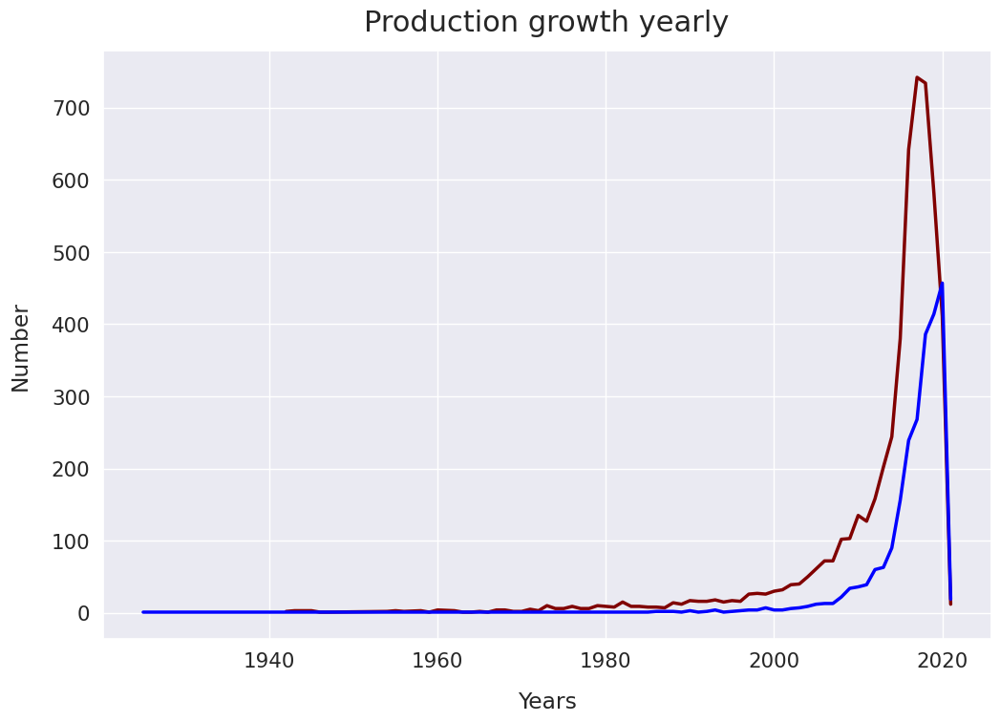

In [158]:
# visualizing the Movies and TV Shows based on the release year
sns.set(font_scale=1.4)
movies_year.plot(figsize=(12, 8), linewidth=2.5, color='maroon',label="Movies / year",ms=3)
tvshows_year.plot(figsize=(12, 8), linewidth=2.5, color='blue',label="TV Shows / year")
plt.xlabel("Years", labelpad=15)
plt.ylabel("Number", labelpad=15)
plt.title("Production growth yearly", y=1.02, fontsize=22);

##### 1. Why did you pick the specific chart?

To compare TV Shows v/s Movies growth throughout the years

##### 2. What is/are the insight(s) found from the chart?

Movies production/released got increased suddenly after 2000's compared to TV Shows  

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 5(Yearwise TV Shows & Movies)

<Axes: xlabel='count', ylabel='release_year'>

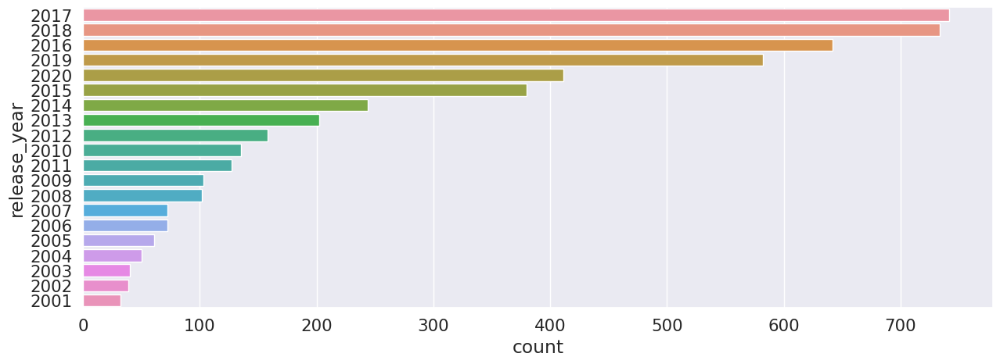

In [159]:
#Visualizing Number of Movies released per year in last 20 years

plt.figure(figsize=(15,5))
sns.countplot(y=movies['release_year'],data=df,order=movies['release_year'].value_counts().index[0:20])

<Axes: xlabel='count', ylabel='release_year'>

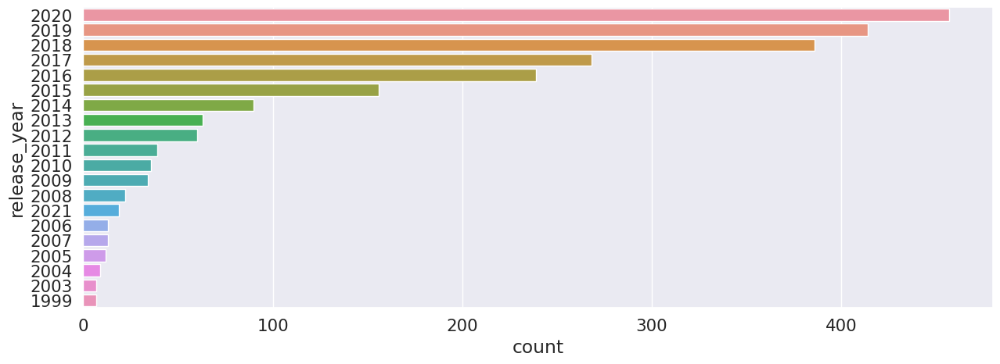

In [160]:
#Visualizing Number of TV Shows released per year in last 20 years

plt.figure(figsize=(15,5))
sns.countplot(y=tv_shows['release_year'],data=df,order=tv_shows['release_year'].value_counts().index[0:20])

##### 1. Why did you pick the specific chart?

To get Number of Movies and TV Shows released in last 20 years.e

##### 2. What is/are the insight(s) found from the chart?

from 2015 onwards number of movies and tvshows got almost doubled in production.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 6(Monthwise releases)

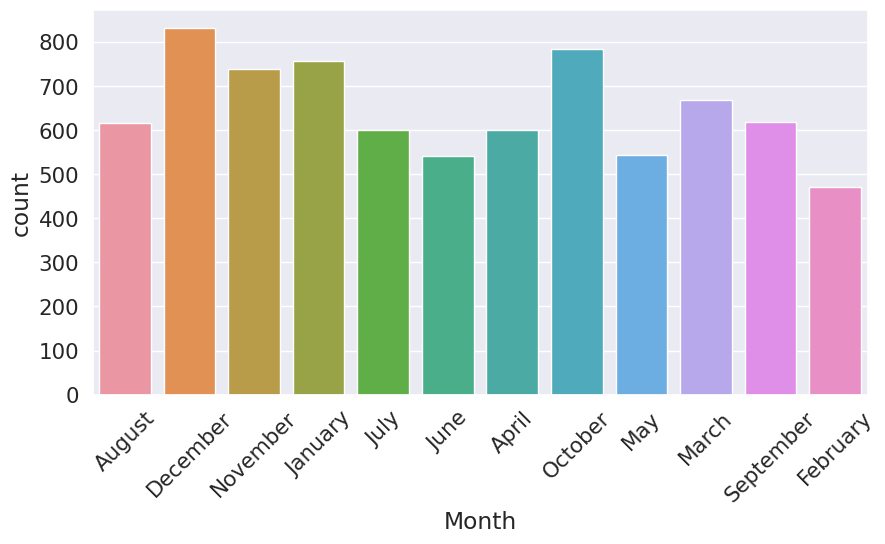

In [161]:
# Chart - 6 visualization code
plt.figure(figsize=(10,5))
ax=sns.countplot(data=df, x=df['Month'])
plt.xticks(rotation=45)

# Display the plot
plt.show()

##### 1. Why did you pick the specific chart?

To Check is there any difference between releases of tvshows and movies monthwise

##### 2. What is/are the insight(s) found from the chart?

There is no such difference 

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 7(Monthwise TVshows & Movies)

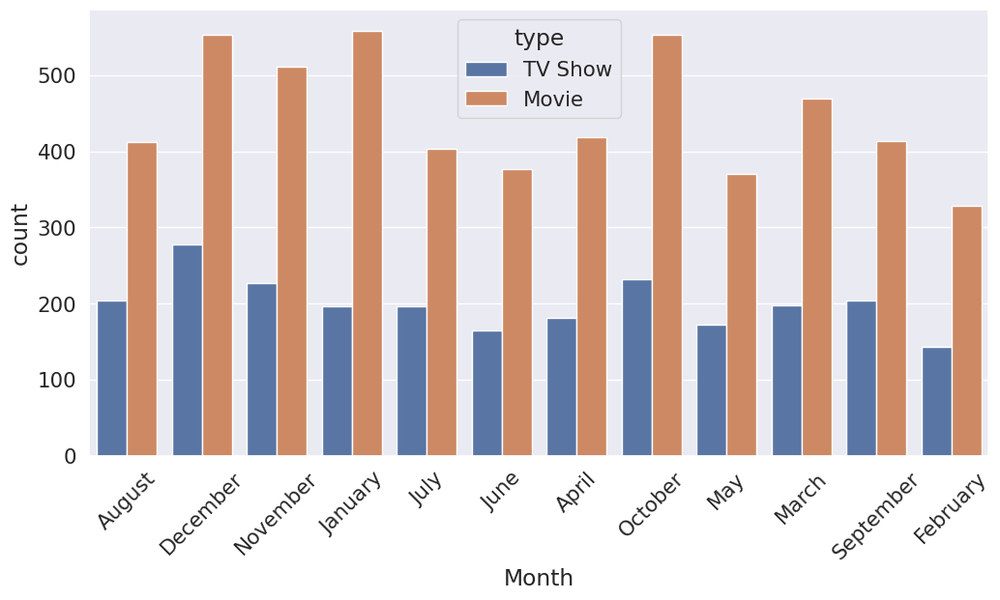

In [162]:
# Chart - 7 visualization code
plt.figure(figsize=(12,6))
ax=sns.countplot(data=df, x='Month',hue='type')
plt.xticks(rotation=45)

# Display the plot
plt.show()

##### 1. Why did you pick the specific chart?

previously we already compared monthwise but that was for combined releases.

this is to check whether number of releases are varying only for tvshows or movies.

##### 2. What is/are the insight(s) found from the chart?

again there is no such difference for movies and tvshows .

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 8(Top & Last 10 genres )

In [163]:
# seperating genre from listed_in columns for analysis purpose
genres = df['listed_in'].str.split(', ', expand=True).stack()

# top 10 genres in listed movies/TV shows
genres = genres.value_counts().reset_index().rename(columns={'index':'genre', 0:'count'})
genres.head()

,genre,count
0,International Movies,2437
1,Dramas,2105
2,Comedies,1471
3,International TV Shows,1197
4,Documentaries,786


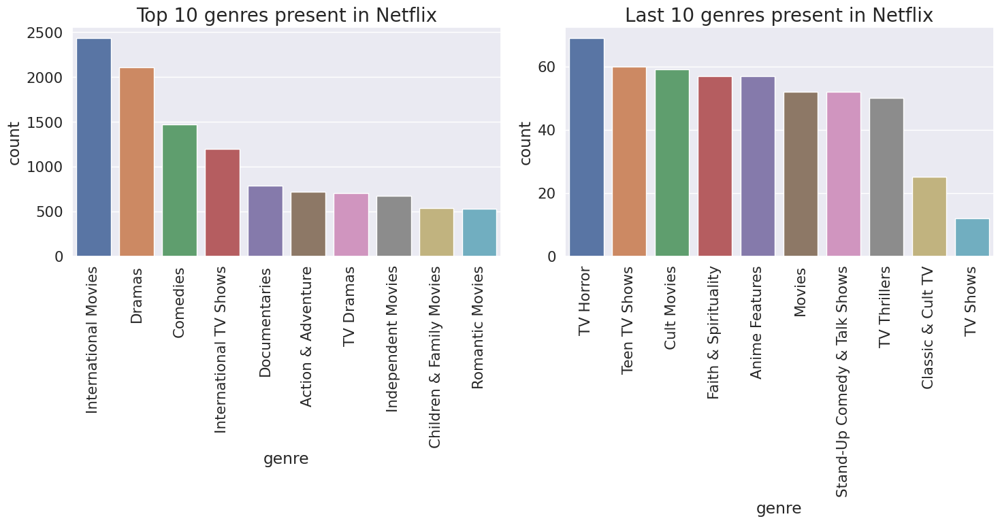

In [164]:
 
# plotting graph
fig,ax = plt.subplots(1,2, figsize=(15,8))

# Top 10 genres
top = sns.barplot(x='genre', y = 'count', data=genres[:10], ax=ax[0])
top.set_title('Top 10 genres present in Netflix', size=20)
plt.setp(top.get_xticklabels(), rotation=90)

# Last 10 genres
bottom = sns.barplot(x='genre', y = 'count', data=genres[-10:], ax=ax[1])
bottom.set_title('Last 10 genres present in Netflix', size=20)
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

Checkin Top and Last 10 genres on Netflix.

##### 2. What is/are the insight(s) found from the chart?

International movies, dramas, comedy is prefred the most while TV Thriller, Classic & Cult TV , TV Shows are at last.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 9(Distribution of movies and tvshows)

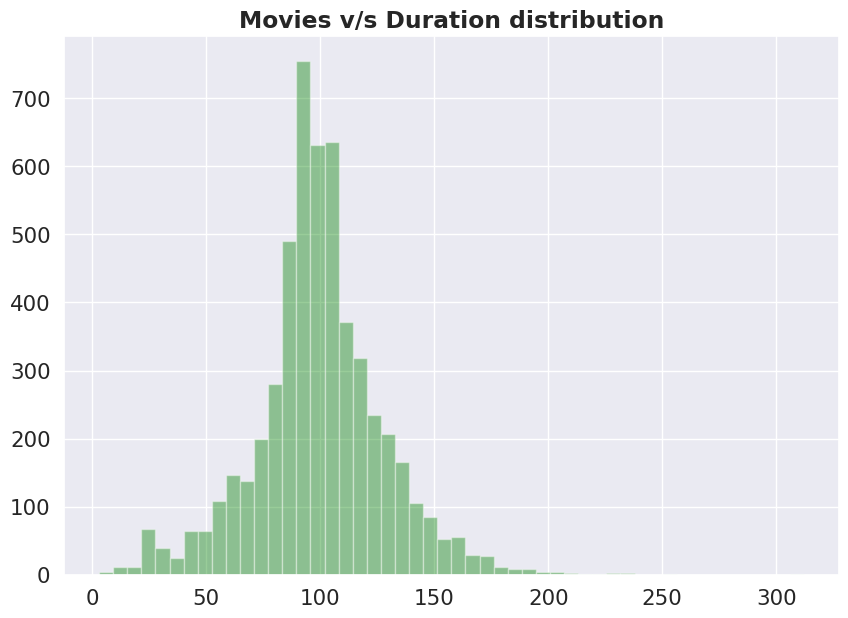

In [165]:
# Chart - 9 visualization code
#Checking the distribution of Movie Durations
plt.figure(figsize=(10,7))
#Regular Expression pattern \d is a regex pattern for digit + is a regex pattern for at leas
sns.distplot(movies['duration'].str.extract('(\d+)'),kde=False, color=['green'])
plt.title('Movies v/s Duration distribution',fontweight="bold")
plt.show()

<Axes: title={'center': 'Distribution of TV Shows duration'}, xlabel='duration', ylabel='count'>

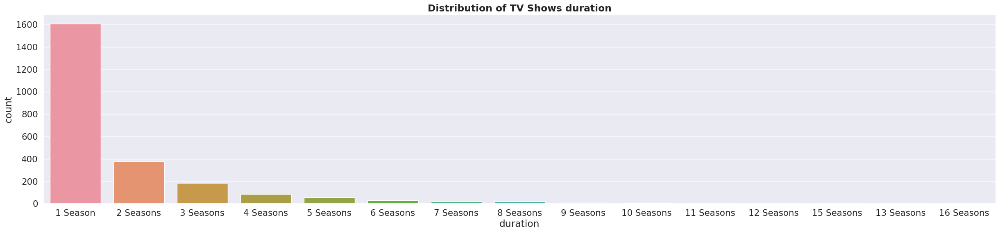

In [166]:
#Checking the distribution of TV SHOWS
plt.figure(figsize=(30,6))
plt.title("Distribution of TV Shows duration",fontweight='bold')
sns.countplot(x=tv_shows['duration'],data=tv_shows,order = tv_shows['duration'].value_counts().index)

##### 1. Why did you pick the specific chart?

To Check the distribution of duration with respect to Movies & TV Shows.

##### 2. What is/are the insight(s) found from the chart?

Duration of movies is Normally Distributed.

most of the TV Shows are not having more than 1 Seasons.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 10(Countriwise Movies and TV Shows)

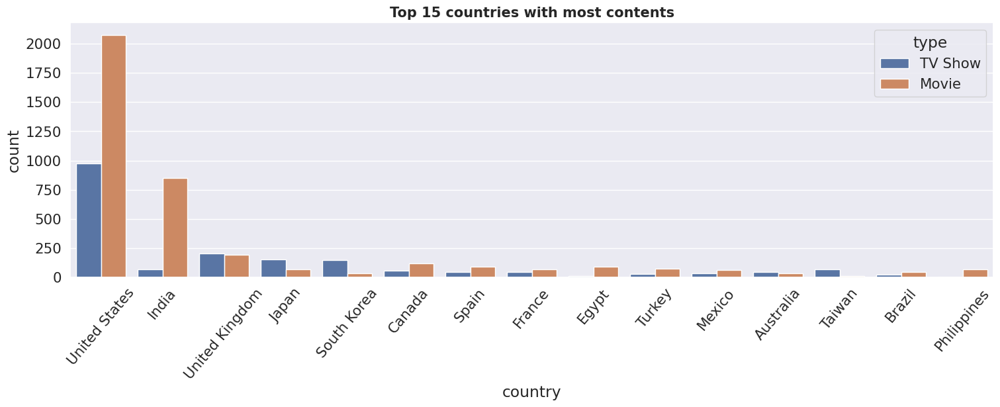

In [167]:
#Visualizing top15 countries with most content 

plt.figure(figsize=(18,5))
sns.countplot(x=df['country'],order=df['country'].value_counts().index[0:15],hue=df['type'])
plt.xticks(rotation=50)
plt.title('Top 15 countries with most contents', fontsize=15, fontweight='bold')
plt.show()

##### 1. Why did you pick the specific chart?

To check contriwise content of movies and tvshows .

##### 2. What is/are the insight(s) found from the chart?

United States and India having more content with US having equal number of tv shows and movies while in India number of movies are more as compared to tvshows.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 11(WordCloud for Description)

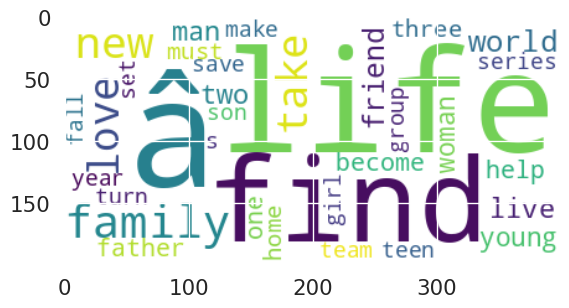

In [168]:
# text documents
text = " ".join(word for word in df['description'])

# create the word cloud using WordCloud library
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15).generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.show()

##### 1. Why did you pick the specific chart?

To check Repeatative words in description.

##### 2. What is/are the insight(s) found from the chart?

Life, Love , Family, Friend , World this are the repeatative words found in description.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 12(Top 10 Actors )

In [169]:
# seperating actors from cast column
cast = df['cast'].str.split(', ', expand=True).stack()

# top actors name who play highest role in movie/show.
cast.value_counts()[1:]

Anupam Kher         42
Shah Rukh Khan      35
Naseeruddin Shah    30
Om Puri             30
Takahiro Sakurai    29
                    ..
Mylene Dizon         1
Lorenz Martinez      1
Art AcuÃ±a           1
Archie Alemania      1
Rachel Khoo          1
Length: 32836, dtype: int64

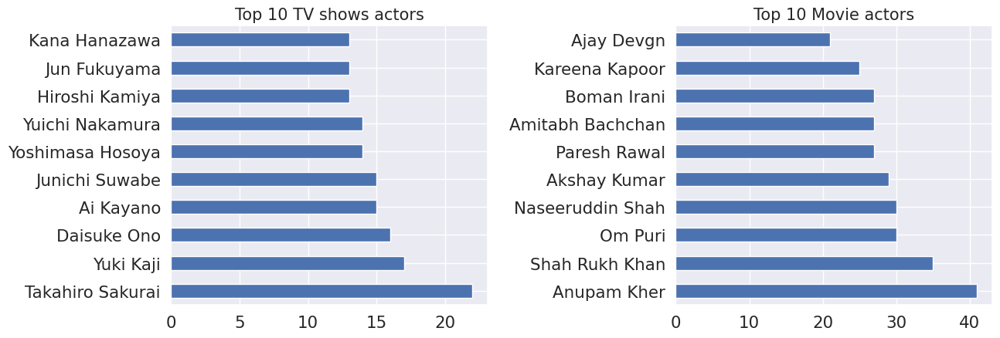

In [170]:
fig,ax = plt.subplots(1,2, figsize=(14,5))

# seperating TV shows actor from cast column
top_TVshows_actor = tv_shows['cast'].str.split(', ', expand=True).stack()
# plotting actor who appeared in highest number of TV Show
a = top_TVshows_actor.value_counts()[1:].head(10).plot(kind='barh', ax=ax[0])
a.set_title('Top 10 TV shows actors', size=15)

# seperating movie actor from cast column
top_movie_actor = movies['cast'].str.split(', ', expand=True).stack()
# plotting actor who appeared in highest number of Movie
b = top_movie_actor.value_counts()[1:].head(10).plot(kind='barh', ax=ax[1])
b.set_title('Top 10 Movie actors', size=15)

plt.tight_layout(pad=1.2, rect=[0, 0, 0.95, 0.95])
plt.show()

##### 1. Why did you pick the specific chart?

To check top 10 TV Shows & Movies Actors .

##### 2. What is/are the insight(s) found from the chart?

TV Shows actors are from all around the world but Movies actors are all  from India.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 13

In [171]:
# Chart - 13 visualization code

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 14 - Correlation Heatmap

In [172]:
# Correlation Heatmap visualization code

#There is no numerical data hence no need to find textual data.

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

#### Chart - 15 - Pair Plot 

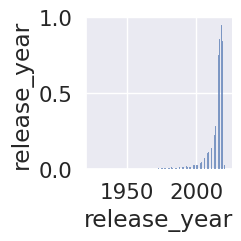

In [173]:
# Pair Plot visualization code
sns.pairplot(df)

##### 1. Why did you pick the specific chart?

##### 2. What is/are the insight(s) found from the chart?

There is no such relationship between features because of textual data present in dataframe.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

H0: There is no difference in the average duration of movies released before and after a year 2000

H1: There is difference in the average duration of movies released before and after a year 2000

#### 2. Perform an appropriate statistical test.

In [174]:
from scipy.stats import ttest_ind

# Convert the "release_year" column to numeric
df['release_year'] = pd.to_numeric(df['release_year'], errors='coerce')
alpha=0.05

cutoff_year = 2000

# extracting minutes from duration feature
movies['minute'] = movies['duration'].str.extract('(\d+)').apply(pd.to_numeric)

# Split the movies into two groups based on the release year
before_cutoff = movies.loc[movies['release_year'] < cutoff_year, 'minute']
after_cutoff = movies.loc[movies['release_year'] >= cutoff_year, 'minute']

# Perform the t-test
t, p = ttest_ind(before_cutoff.dropna(), after_cutoff.dropna())

# Print the result
print(f"t = {t}, p = {p}")

if p < alpha:
    print("Reject H0,There is no difference in the average duration of movies released before and after a year 2000.")
else:
    print("Accept H0,There is difference in the average duration of movies released before and after a year 2000")

t = 11.364317366344364, p = 1.3680001607961066e-29
Reject H0,There is no difference in the average duration of movies released before and after a year 2000.


##### Which statistical test have you done to obtain P-Value?

I have used two sample t-test to obtain P-Value

##### Why did you choose the specific statistical test?

there are two samples that are independent before and after cutoff years thats why i used 'two sample t-test'. 

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

H0:There is a significant relationship between the release_year and the rating of a movie or TV show

H1:There is no significant relationship between the release_year and the rating of a movie or TV show

#### 2. Perform an appropriate statistical test.

In [175]:
from scipy.stats import spearmanr
alpha=0.05

corr, p = spearmanr(df['release_year'], df['rating'].astype('category').cat.codes)
print("Spearman correlation coefficient:", corr)
print("p-value:", p)

if p < alpha:
    print("Reject H0,There is no relationship between release_year and rating .")
else:
    print("Accept H0,There is relationship between release_year and rating .")

Spearman correlation coefficient: 0.2676349625560378
p-value: 1.4455250843140321e-127
Reject H0,There is no relationship between release_year and rating .


##### Which statistical test have you done to obtain P-Value?

Spearman correlational test

##### Why did you choose the specific statistical test?

to check relationship between two features 

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

H0: There is no correlation between release_year and duration of movies

H1: There is correlation between release_year and duration of movies

#### 2. Perform an appropriate statistical test.

In [176]:
# Perform Statistical Test to obtain P-Value
from scipy.stats import spearmanr
alpha=0.05
corr, p = spearmanr(movies['release_year'], movies['duration'])
print("Spearman correlation coefficient:", corr)
print("p-value:", p)

if p < alpha:
    print("Reject H0, There is correlation between release_year and duration of movies.")
else:
    print("Accept H0, There is no correlation between release_year and duration of movies.")

Spearman correlation coefficient: 0.06492205409390611
p-value: 1.913898766374338e-06
Reject H0, There is correlation between release_year and duration of movies.


In [177]:
movies.head()

,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,Month,target_ages,minute
1,Movie,7:19,"DemiÃ¡n Bichir, HÃ©ctor Bonilla, Oscar Serrano...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,December,Adults,93
2,Movie,23:59,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",December,Adults,78
3,Movie,9,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",November,Teens,80
4,Movie,21,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,January,Teens,123
6,Movie,122,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,2020-06-01,2019,TV-MA,95 min,"Horror Movies, International Movies","After an awful accident, a couple admitted to ...",June,Adults,95


##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

## ***6. Feature Engineering & Data Pre-processing***

In [178]:
df.dtypes

type                    object
title                   object
cast                    object
country                 object
date_added      datetime64[ns]
release_year             int64
rating                  object
duration                object
listed_in               object
description             object
Month                   object
target_ages             object
dtype: object

### 1. Handling Missing Values

In [179]:
# Handling Missing Values & Missing Value Imputation
df.isnull().sum()

# We already have treated missing values so skipping this step for now

type            0
title           0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
Month           0
target_ages     0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

Answer Here.

### 2. Handling Outliers

<Axes: >

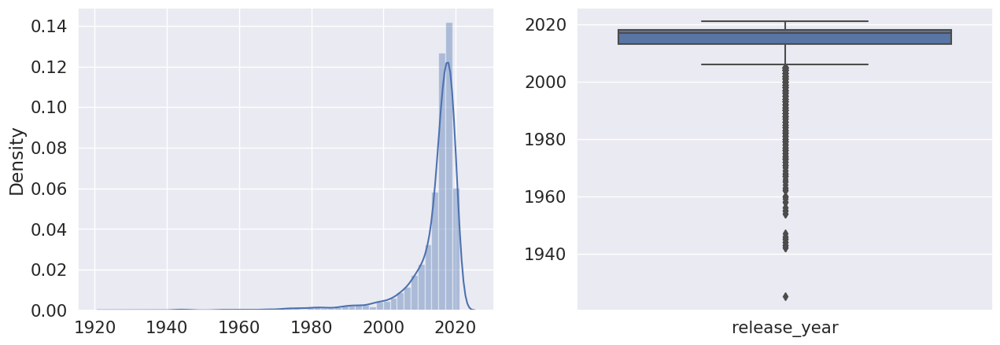

In [180]:
# Handling Outliers & Outlier treatments
fig,ax = plt.subplots(1,2, figsize=(15,5))

# Display boxplot and dist plot.
sns.distplot(x=df['release_year'], ax=ax[0])
sns.boxplot(data=df, ax=ax[1])

##### What all outlier treatment techniques have you used and why did you use those techniques?

Only release_year is in numerical and in addition it is date so we cant treat it as outliers

other features are textual so skipping this step also

### 3. Categorical Encoding

In [181]:
# Encode your categorical columns
# No need to encode data that is present in paragraph formats so skipping this step also

#### What all categorical encoding techniques have you used & why did you use those techniques?

Answer Here.

### 4. Textual Data Preprocessing 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

In [182]:
df.dtypes

type                    object
title                   object
cast                    object
country                 object
date_added      datetime64[ns]
release_year             int64
rating                  object
duration                object
listed_in               object
description             object
Month                   object
target_ages             object
dtype: object

In [183]:
#Merging all textual data into one

df['text_data'] = df['cast'] + df['country'] + \
                     df['rating'] + df['listed_in'] + df['description']

#### 1. Expand Contraction

In [184]:
pip install contractions

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [185]:
# Expand Contraction
import contractions
df['text_data'] = df['text_data'].apply(contractions.fix)

print(df)

         type                                    title  \
0     TV Show                                       3%   
1       Movie                                     7:19   
2       Movie                                    23:59   
3       Movie                                        9   
4       Movie                                       21   
...       ...                                      ...   
7782    Movie                                     Zozo   
7783    Movie                                   Zubaan   
7784    Movie                        Zulu Man in Japan   
7785  TV Show                    Zumbo's Just Desserts   
7786    Movie  ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS   

                                                   cast  \
0     JoÃ£o Miguel, Bianca Comparato, Michel Gomes, ...   
1     DemiÃ¡n Bichir, HÃ©ctor Bonilla, Oscar Serrano...   
2     Tedd Chan, Stella Chung, Henley Hii, Lawrence ...   
3     Elijah Wood, John C. Reilly, Jennifer Connelly...   
4     Ji

In [186]:
df['text_data'][0]

'JoÃ£o Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, ZezÃ© Motta, Celso FrateschiBrazilTV-MAInternational TV Shows, TV Dramas, TV Sci-Fi & FantasyIn a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.'

#### 2. Lower Casing & Stopwords removal

In [187]:
# create a set of English stop words

stop_words = stopwords.words('english')

print(np.array(stop_words))

['i' 'me' 'my' 'myself' 'we' 'our' 'ours' 'ourselves' 'you' "you're"
 "you've" "you'll" "you'd" 'your' 'yours' 'yourself' 'yourselves' 'he'
 'him' 'his' 'himself' 'she' "she's" 'her' 'hers' 'herself' 'it' "it's"
 'its' 'itself' 'they' 'them' 'their' 'theirs' 'themselves' 'what' 'which'
 'who' 'whom' 'this' 'that' "that'll" 'these' 'those' 'am' 'is' 'are'
 'was' 'were' 'be' 'been' 'being' 'have' 'has' 'had' 'having' 'do' 'does'
 'did' 'doing' 'a' 'an' 'the' 'and' 'but' 'if' 'or' 'because' 'as' 'until'
 'while' 'of' 'at' 'by' 'for' 'with' 'about' 'against' 'between' 'into'
 'through' 'during' 'before' 'after' 'above' 'below' 'to' 'from' 'up'
 'down' 'in' 'out' 'on' 'off' 'over' 'under' 'again' 'further' 'then'
 'once' 'here' 'there' 'when' 'where' 'why' 'how' 'all' 'any' 'both'
 'each' 'few' 'more' 'most' 'other' 'some' 'such' 'no' 'nor' 'not' 'only'
 'own' 'same' 'so' 'than' 'too' 'very' 's' 't' 'can' 'will' 'just' 'don'
 "don't" 'should' "should've" 'now' 'd' 'll' 'm' 'o' 're' 've' 'y'

In [188]:
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)
     
df['text_data'] = df['text_data'].apply(stopwords)

df['text_data'][0]

'joã£o miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezã© motta, celso frateschibraziltv-mainternational tv shows, tv dramas, tv sci-fi & fantasyin future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.'

#### 3. Removing Punctuations

Removing punctuation is the process of removing any punctuation marks (e.g., periods, commas, exclamation points, etc.) from text data.

In [189]:
# Remove Punctuations
def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

df['text_data'] = df['text_data'].apply(remove_punctuation)

df['text_data'][0]

'joã£o miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezã© motta celso frateschibraziltvmainternational tv shows tv dramas tv scifi  fantasyin future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor'

#### 4. Removing URLs & Removing words and digits contain digits.

In [190]:
# Remove URLs & Remove words and digits contain digits
import re

def clean_text(text):
    # Remove URLs
    text = re.sub(r'http\S+', '', text)
    # Remove words/digits containing digits
    text = re.sub(r'\w*\d\w*', '', text)
    # Remove digits within words
    text = re.sub(r'\b\d+\b', '', text)
    return text

# Apply clean_text() function to 'text_data' column
df['text_data'] = df['text_data'].apply(clean_text)

df['text_data'][0]


#No effect on data since we dont have any URL's and Digits within digits or words

'joã£o miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezã© motta celso frateschibraziltvmainternational tv shows tv dramas tv scifi  fantasyin future elite inhabit island paradise far crowded slums get one chance join  saved squalor'

#### 5. Removing Stopwords & Removing White spaces

In [191]:
# Remove Stopwords
#Already removed

In [192]:
# Remove White spaces


#### 6. Rephrase Text

In [193]:
# Rephrase Text
#No need to repharase , as it is required for sentiment analysis.

#### 7. Tokenization

In [194]:
# Tokenization
import nltk
nltk.download('punkt')


#from nltk.tokenize import word_tokenize
#def tokenize_text(text):
#   tokens = word_tokenize(text)
#   return tokens

#df['text_data'] = df['text_data'].apply(tokenize_text)

#df['text_data'][0]




[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

#### 8. Text Normalization(Stemming or Lemmatization)

Stemming is the process of reducing a word to its base or root form. This is a common pre-processing step in natural language processing (NLP) tasks and text analysis. The goal of stemming is to reduce words to their base form so that words with the same stem are treated as the same word, even if they are written in different forms. For example, stemming would reduce "running," "runner," and "ran" to the base form "run."

In [195]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)
from nltk.stem import PorterStemmer
tokenizer = nltk.tokenize.word_tokenize
stemmer = PorterStemmer()
def tokenize_and_stem_text(text):
    tokens = tokenizer(text)
    stems = [stemmer.stem(token) for token in tokens]
    return stems

df['text_data'] = df['text_data'].apply(tokenize_and_stem_text)

print(df['text_data'][0])

['joã£o', 'miguel', 'bianca', 'comparato', 'michel', 'gome', 'rodolfo', 'valent', 'vaneza', 'oliveira', 'rafael', 'lozano', 'vivian', 'porto', 'mel', 'fronckowiak', 'sergio', 'mamberti', 'zezã©', 'motta', 'celso', 'frateschibraziltvmaintern', 'tv', 'show', 'tv', 'drama', 'tv', 'scifi', 'fantasyin', 'futur', 'elit', 'inhabit', 'island', 'paradis', 'far', 'crowd', 'slum', 'get', 'one', 'chanc', 'join', 'save', 'squalor']


##### Which text normalization technique have you used and why?

Answer Here.

#### 9. Part of speech tagging

In [196]:
# POS Taging

#### 10. Text Vectorization

Text vectorization is the process of converting text data into numerical vectors or feature representations that can be used for machine learning or data analysis tasks. In simple terms, it transforms the text data into numerical data which can be easily processed by machine learning algorithms. There are several text vectorization techniques available such as bag of words, Tf-idf, Word2vec, and GloVe etc.

* We will be using the TF-IDF vectorizer, which stands for Term Frequency Inverse Document Frequency
* TF(t) = (Number of times term t appears in a document) / (Total number of terms in the document). The more often a word appears in a document, the higher its TF score.
* IDF(t) = IDF measures how rare a word is across all the documents in the corpus. The rarer a word, the higher its IDF score.
* The product of TF and IDF is used to calculate the overall weight of a word in a document, which is known as the TF-IDF score. Words with high TF-IDF scores are considered to be more important and relevant to the document than words with low TF-IDF scores.

In [197]:
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np

def apply_tfidf(data):
    data = [' '.join(words) for words in data]
    # Create an instance of the TfidfVectorizer class
    tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features = 10000)

    # Fit and transform the data using the vectorizer
    tfidf_data = tfidf_vectorizer.fit_transform(data)

    # Convert the sparse matrix to a dense numpy array
    tfidf_array = tfidf_data.toarray()

    return tfidf_array, tfidf_vectorizer.vocabulary_.items()

tfidf_array, vocabulary = apply_tfidf(df['text_data'])
print(tfidf_array)
print(tfidf_array.shape)
print(type(tfidf_array))

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
(7770, 10000)
<class 'numpy.ndarray'>


##### Which text vectorization technique have you used and why?

Answer Here.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [198]:
# Manipulate Features to minimize feature correlation and create new features

#### 2. Feature Selection

In [199]:
# Select your features wisely to avoid overfitting

##### What all feature selection methods have you used  and why?

Answer Here.

##### Which all features you found important and why?

Answer Here.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [200]:
# Transform Your data

### 6. Data Scaling

In [201]:
# Scaling your data

##### Which method have you used to scale you data and why?

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Dimensionality reduction is the process of reducing the number of features or dimensions in a dataset while retaining as much information as possible. The main goal of dimensionality reduction is to simplify the data while minimizing the loss of information. It is a crucial step in machine learning and data analysis as it can help to improve the performance of models, reduce overfitting, and make it easier to visualize and interpret the data.

* There are several techniques used for dimensionality reduction, such as:
Principal Component Analysis (PCA), Linear Discriminant Analysis (LDA), t-Distributed Stochastic Neighbor Embedding (t-SNE), Autoencoder, and Random Projection etc.
* We will use Principal Component Analysis (PCA) to reduce the dimensionality of data.

In [202]:
# DImensionality Reduction (If needed)
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(tfidf_array)

PCA(random_state=42)

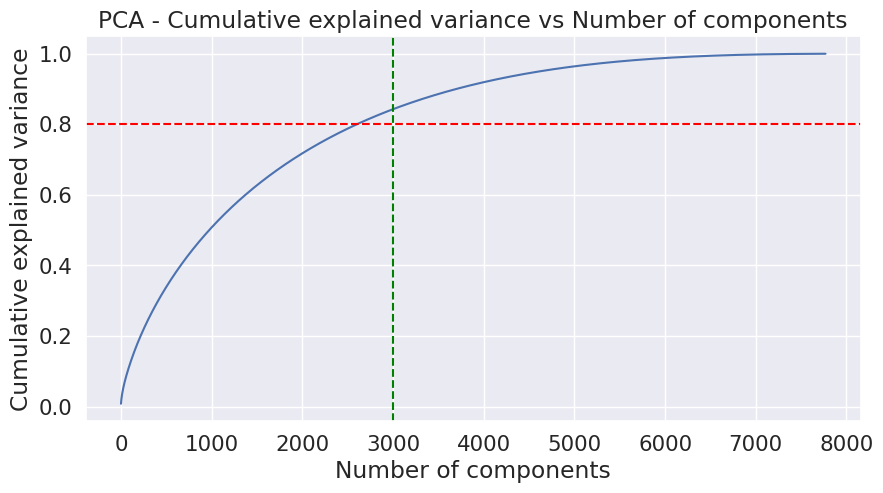

In [203]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs Number of components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

In [204]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(tfidf_array)

PCA(n_components=3000, random_state=42)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

We discover that approximately 7500 components account for 100 percent of the variance.

3000 components alone account for more than 80% of the variance.

Therefore, we can take the top 3000 components to reduce dimensionality and simplify the model while still being able to capture more than 80% of the variance

### 8. Data Splitting

In [205]:
# Split your data to train and test. Choose Splitting ratio wisely.
# transformed features
X = pca.transform(tfidf_array)

# shape of transformed vectors
X.shape

(7770, 3000)

##### What data splitting ratio have you used and why? 

Answer Here.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Answer Here.

In [206]:
# Handling Imbalanced Dataset (If needed)

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***7. ML Model Implementation***

### ML Model - 1(K-Means Clustering)

**K-means clustering** is a popular unsupervised machine learning technique used to group similar data points together. The goal of k-means clustering is to partition a dataset into k clusters, where each cluster contains similar data points and is represented by its centroid.

The k-means algorithm works by first randomly selecting k centroids, one for each cluster. Then, it assigns each data point to the cluster whose centroid is closest to it. This process is repeated until the assignment of data points to clusters no longer changes, or until a maximum number of iterations is reached.


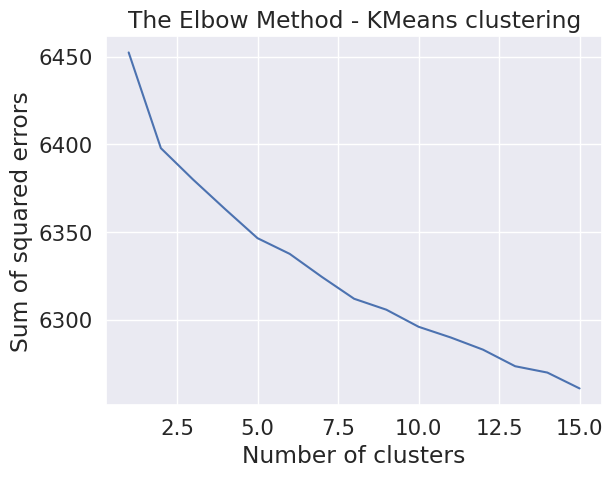

In [207]:
# K-Means clustering Implementation

'''Elbow method to find the optimal value of K'''

# Initialize a list to store the sum of squared errors for each value of K
SSE = []

for k in range(1, 16):
  # Initialize the k-means model with the current value of K
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Compute the sum of squared errors for the model
  SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

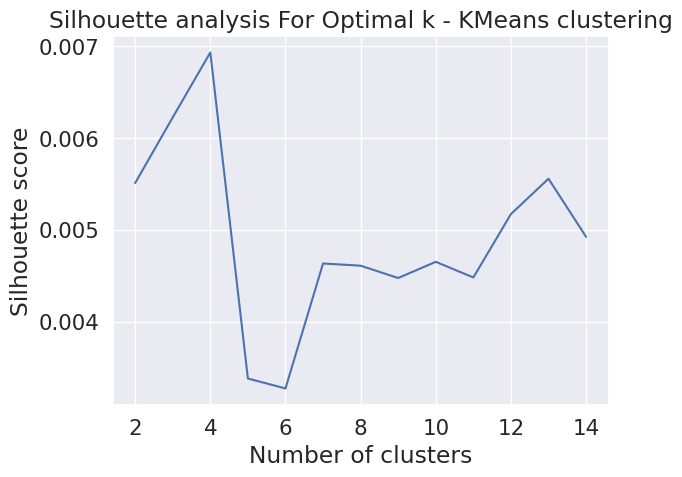

In [208]:
'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 15):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)
  
# Plot the Silhouette analysis
plt.plot(range(2,15), silhouette_avg)
plt.xlabel('Number of clusters') 
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [209]:
# Clustering the data into 6 clusters
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=4, random_state=33)

In [210]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6362.936328731515, 0.006921529903461597)


In [211]:
# Adding a kmeans cluster number attribute
df['kmeans_cluster'] = kmeans.labels_

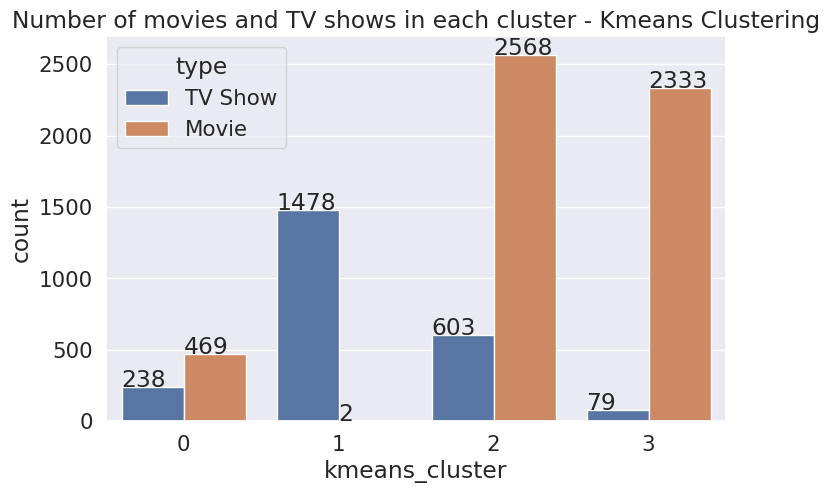

In [212]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=df, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
  graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

###Wordcloud(K-Means)

In [213]:
def kmeans_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = df[['kmeans_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

cluster 0


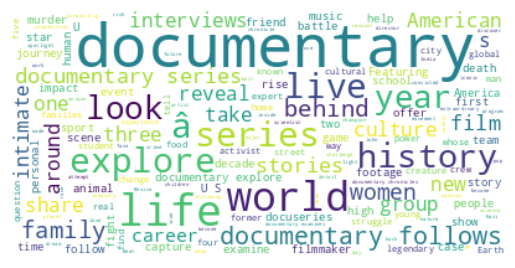

cluster 1


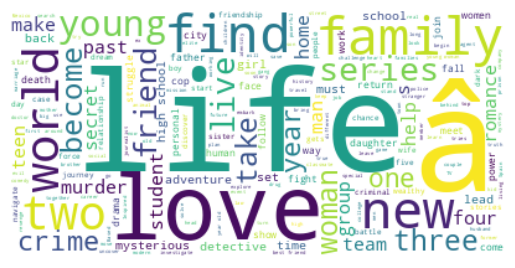

cluster 2


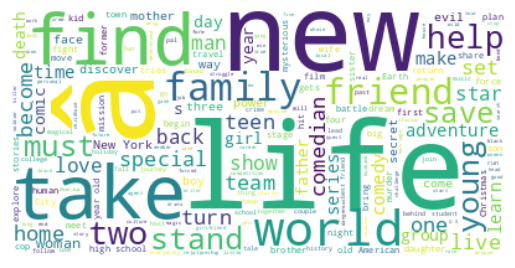

cluster 3


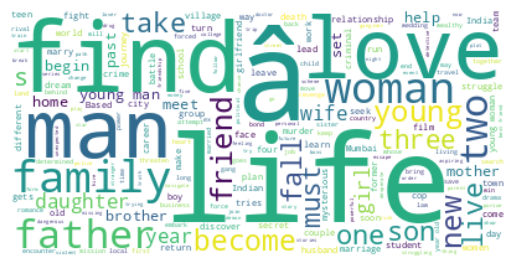

In [214]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

cluster 0


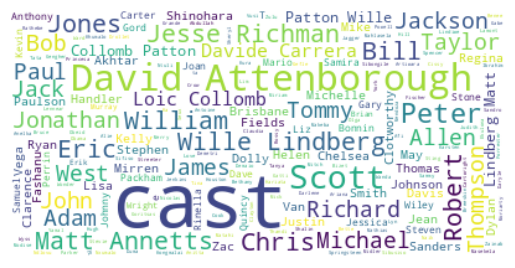

cluster 1


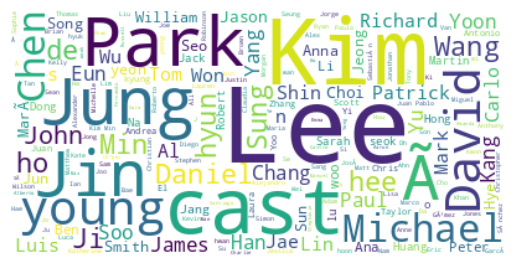

cluster 2


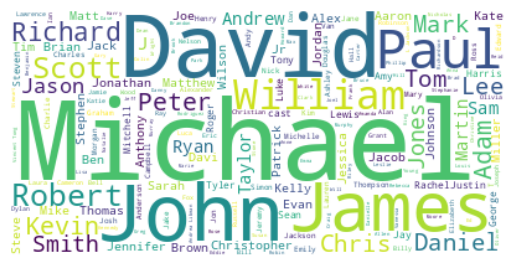

cluster 3


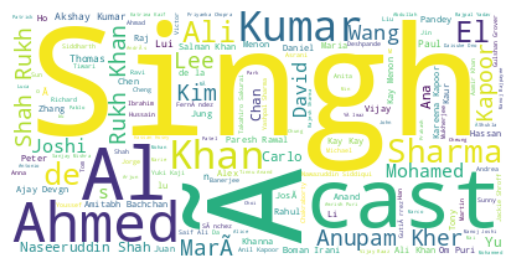

In [215]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

cluster 0


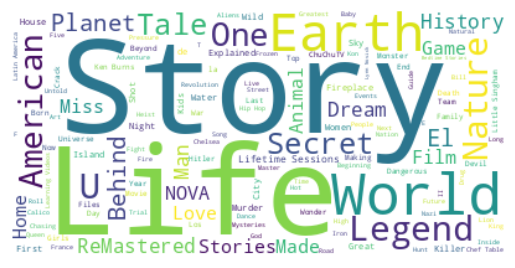

cluster 1


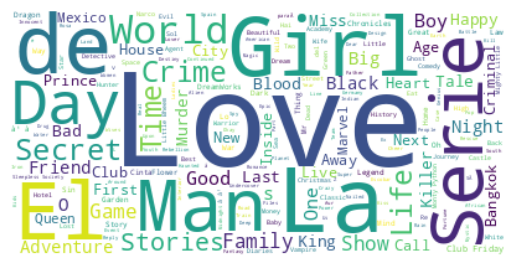

cluster 2


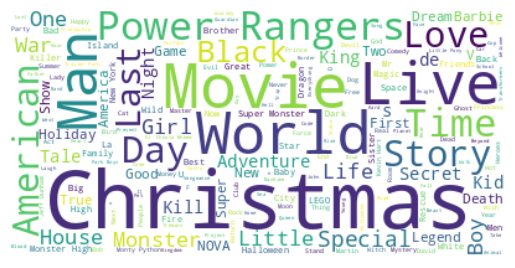

cluster 3


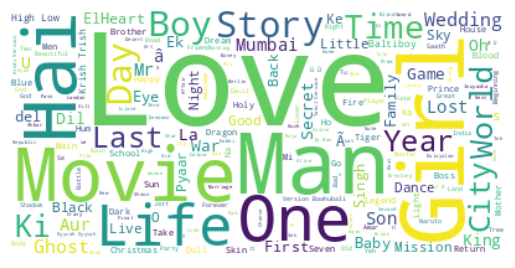

In [216]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

cluster 0


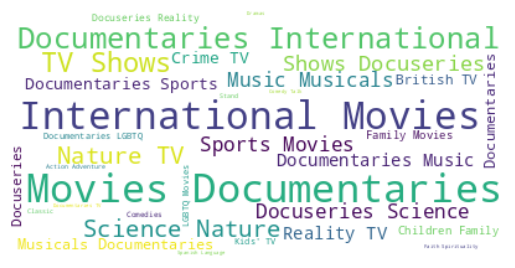

cluster 1


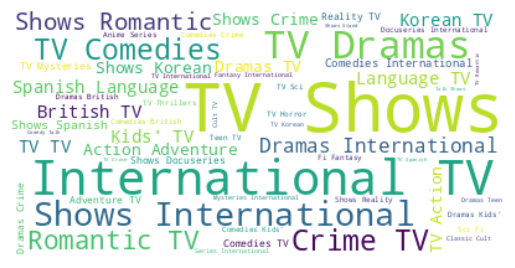

cluster 2


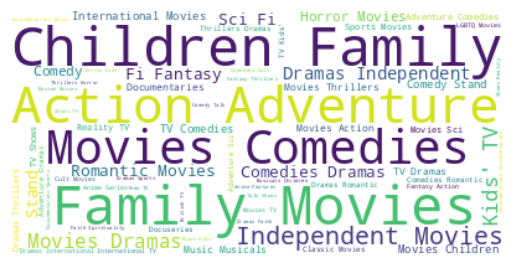

cluster 3


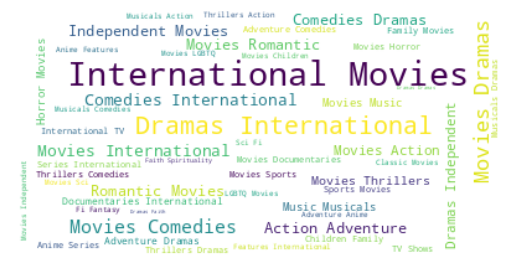

In [217]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

cluster 0


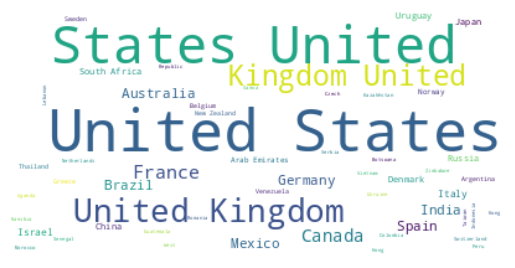

cluster 1


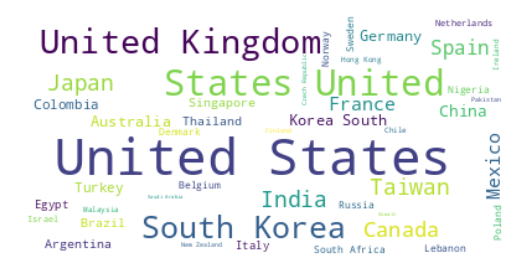

cluster 2


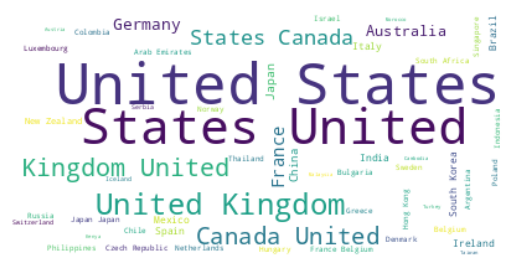

cluster 3


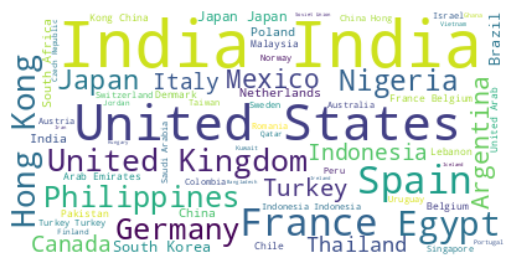

In [218]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [219]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [220]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

### ML Model - 2(Hierarchical Clustering)

**Hierarchical clustering** is a method of clustering data points into a tree-like structure. It is an alternative method to k-means clustering and it is used to group similar data points together in a hierarchical fashion.

There are two main types of Hierarchical clustering: Agglomerative and Divisive. **Agglomerative** is a bottom-up approach where each data point is considered as a separate cluster and the algorithm iteratively merges the closest clusters. On the other hand, Divisive is a top-down approach where all data points are considered as a single cluster and the algorithm iteratively splits the clusters

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

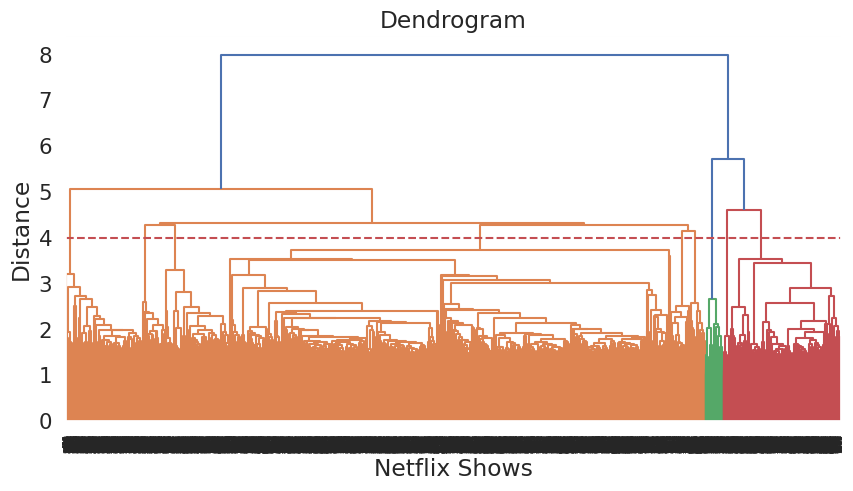

In [221]:
plt.figure(figsize=(10, 5))  
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

In [222]:
#Building 7 clusters using the Agglomerative clustering algorithm:

# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')  
hierarchical.fit_predict(X)

array([1, 6, 1, ..., 6, 1, 0])

In [223]:
# Adding a hierarchical cluster number attribute
df['hierarchical_cluster'] = hierarchical.labels_

In [224]:
print("Silhouette Coefficient: %0.3f"%silhouette_score(X,hierarchical.fit_predict(X), metric='euclidean'))

Silhouette Coefficient: 0.001


In [225]:
df.sample(5)[['type', 'title', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,cast,country,rating,listed_in,description,hierarchical_cluster
7354,TV Show,Unnatural Selection,No cast,United States,TV-MA,"Docuseries, Science & Nature TV",From eradicating disease to selecting a childâ...,4
3255,Movie,"Justice, My Foot!","Stephen Chow, Anita Mui, Carrie Ng, Wai Ai, Be...",Hong Kong,TV-14,"Action & Adventure, Comedies, International Mo...",Slick lawyer Sung fears he's been cursed with ...,6
2884,Movie,Hypersomnia,"Yamila Saud, Gerardo Romano, Jimena BarÃ³n, Va...",Argentina,TV-MA,"Horror Movies, International Movies, Thrillers",A young actress rehearsing for a play about hu...,6
1102,Movie,Bright,"Will Smith, Joel Edgerton, Noomi Rapace, Lucy ...",United States,TV-MA,"Action & Adventure, Sci-Fi & Fantasy","In an LA rife with interspecies tensions, a hu...",6
5368,Movie,Samson,"Taylor James, Billy Zane, Lindsay Wagner, Cait...","South Africa, United States",PG-13,"Action & Adventure, Dramas, Faith & Spirituality",The Biblical story of Samson becomes this swor...,1


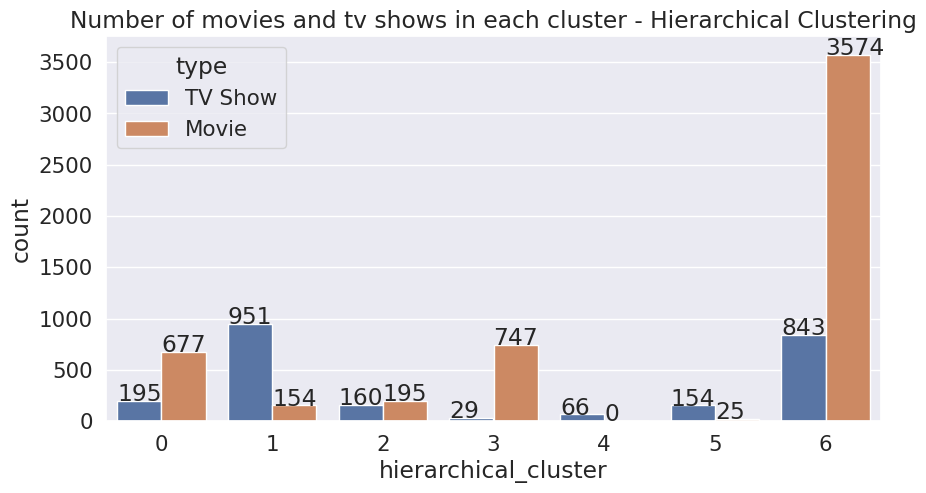

In [226]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=df, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

### WordCloud(Hierarchical)

In [227]:

def hierarchical_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = df[['hierarchical_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['hierarchical_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()
     

cluster 0


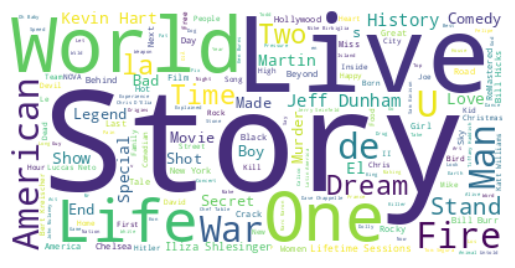

cluster 1


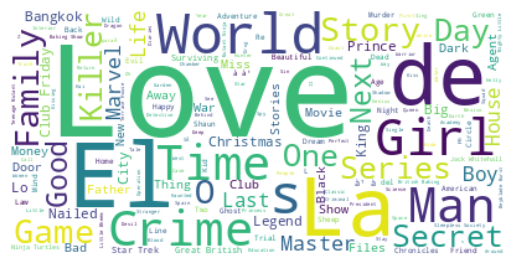

cluster 2


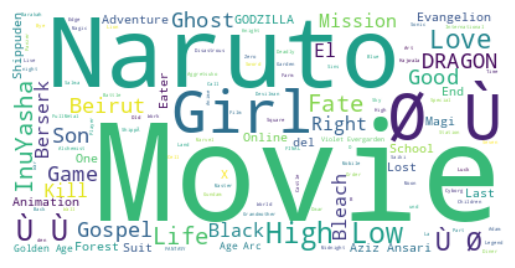

cluster 3


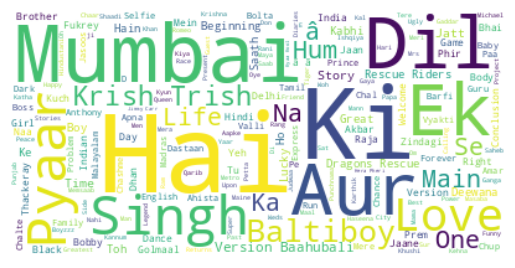

cluster 4


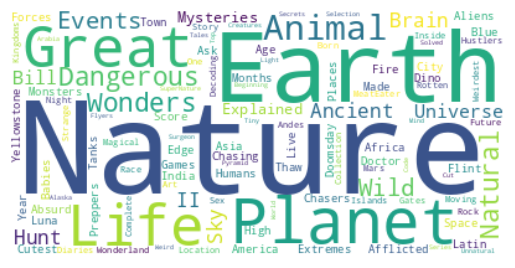

cluster 5


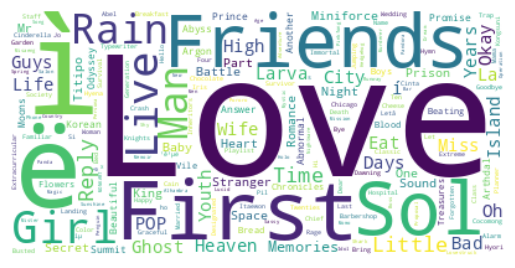

cluster 6


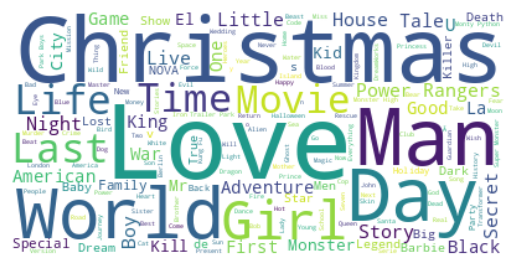

In [228]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

cluster 0


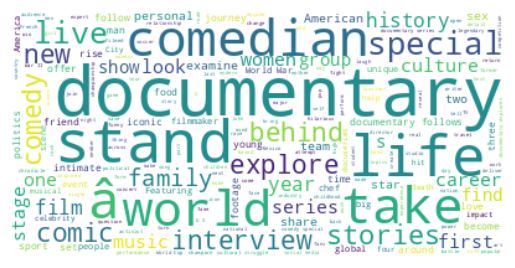

cluster 1


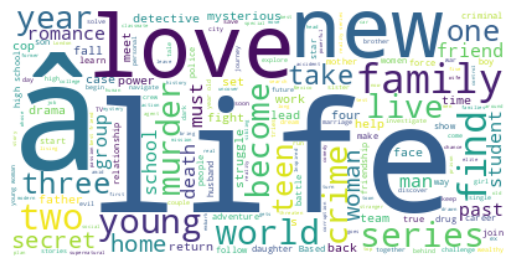

cluster 2


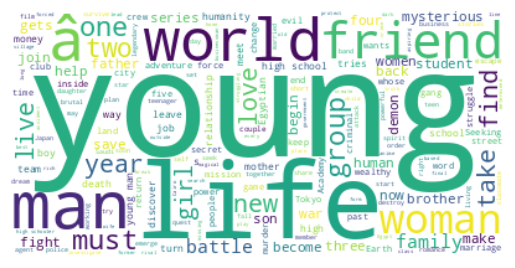

cluster 3


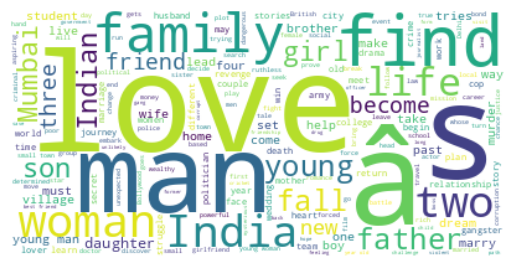

cluster 4


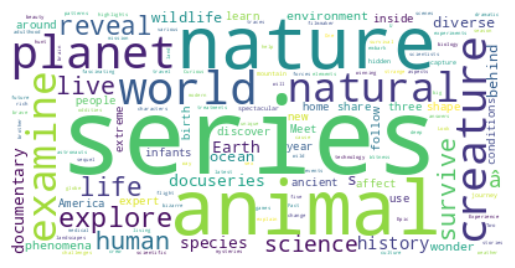

cluster 5


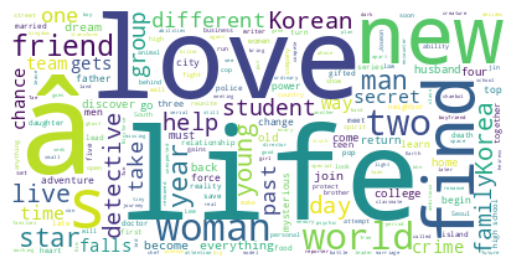

cluster 6


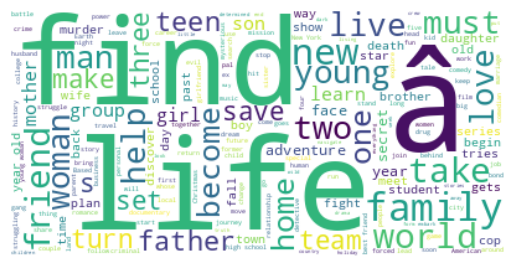

In [229]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

cluster 0


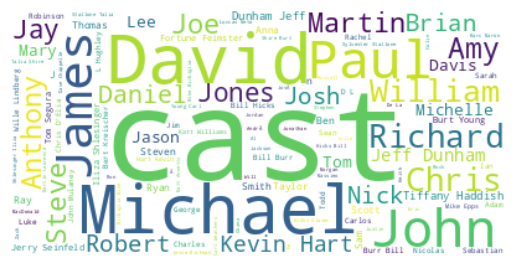

cluster 1


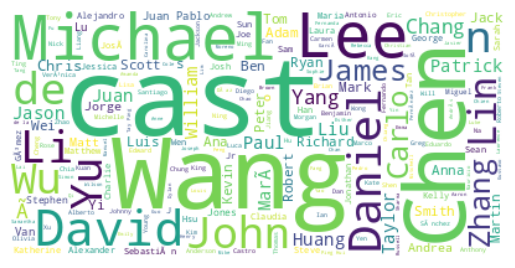

cluster 2


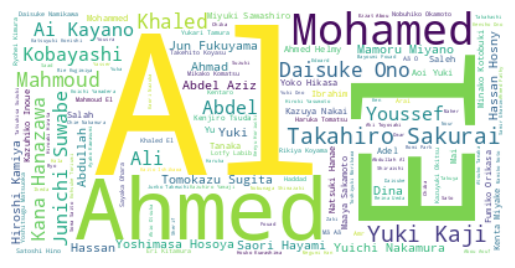

cluster 3


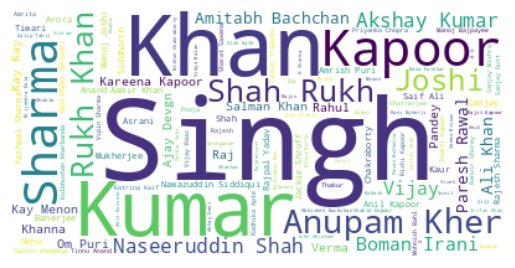

cluster 4


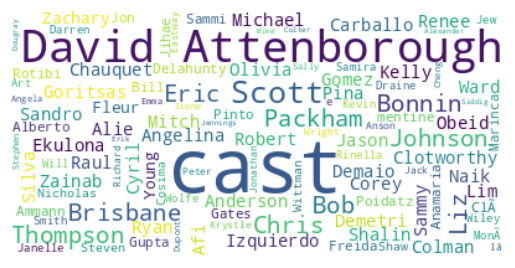

cluster 5


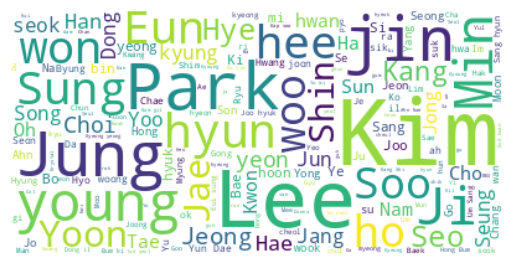

cluster 6


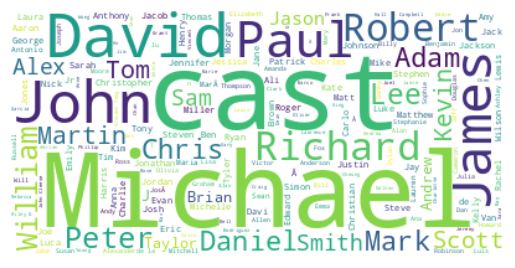

In [230]:

for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

cluster 0


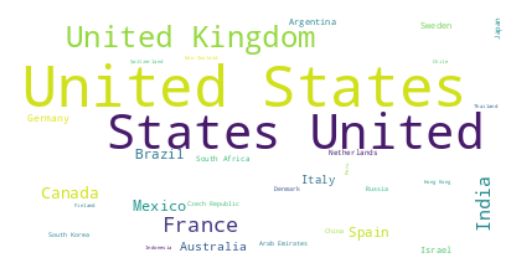

cluster 1


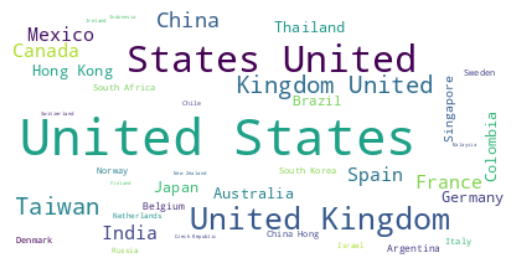

cluster 2


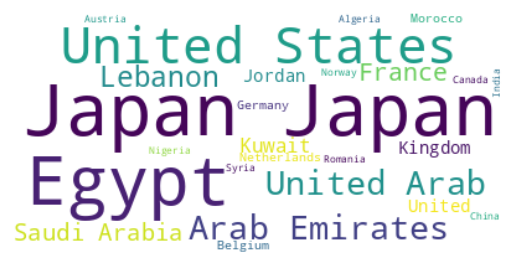

cluster 3


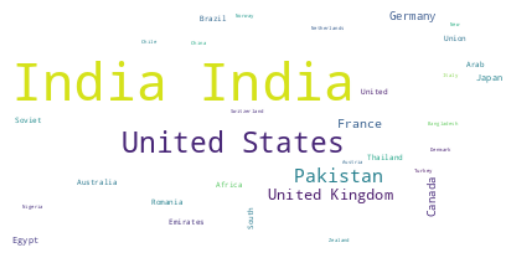

cluster 4


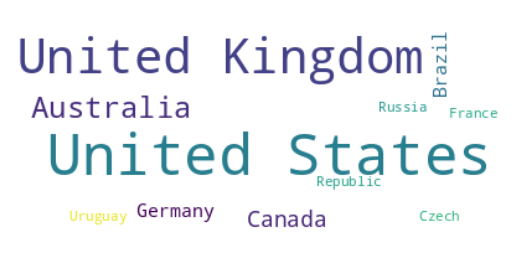

cluster 5


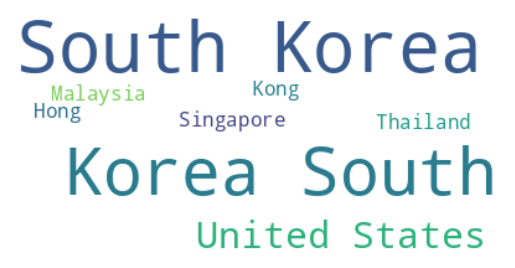

cluster 6


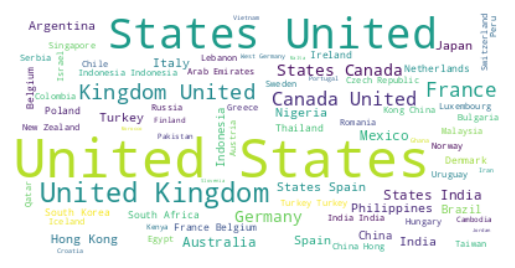

In [231]:

for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

cluster 0


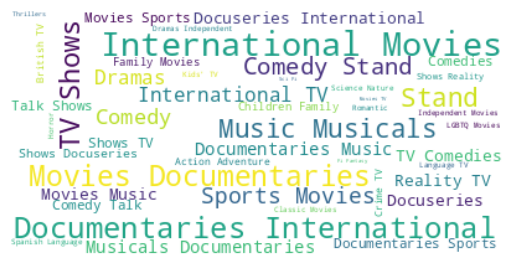

cluster 1


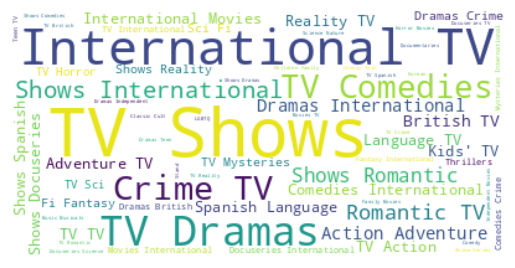

cluster 2


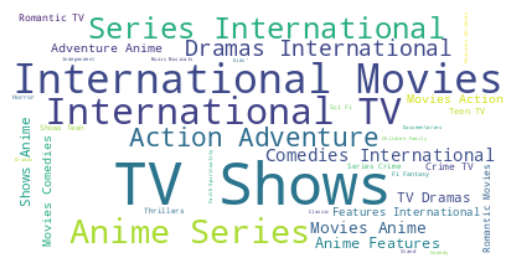

cluster 3


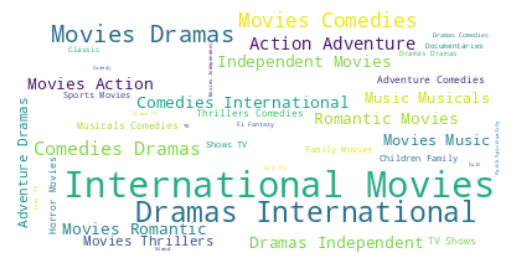

cluster 4


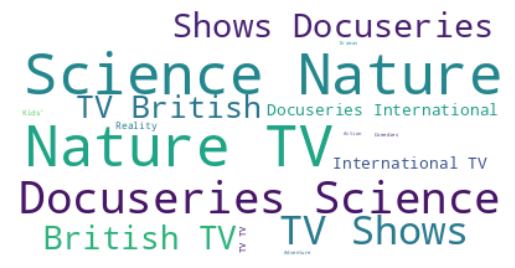

cluster 5


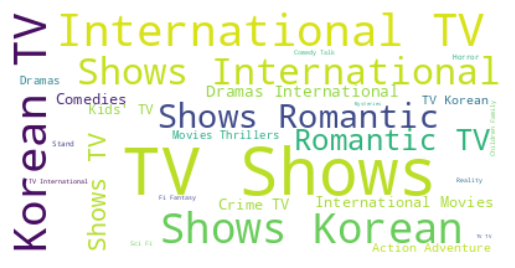

cluster 6


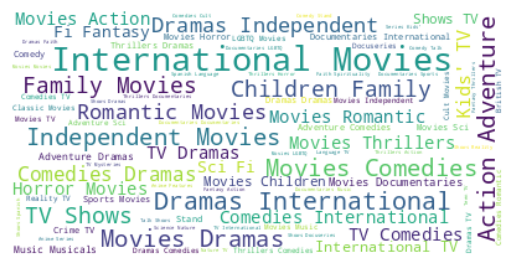

In [232]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

##### Which hyperparameter optimization technique have you used and why?

No need of hyperparameter tuning

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Answer Here.

### ML Model - 3(DB-Scan Clustering)

Known as **Density-based spatial clustering of applications with noise (DBSCAN)** . It is able to find arbitrary shaped clusters and clusters with noise (i.e. outliers).

In [233]:
# DB Scan Implementation

from sklearn.cluster import DBSCAN
from sklearn import metrics

db = DBSCAN(eps=1.0, min_samples=13).fit(X)
labels = db.labels_

In [234]:
print(f"Silhouette Coefficient for DBScan is: {metrics.silhouette_score(X, labels):.3f}")

Silhouette Coefficient for DBScan is: -0.003


In [235]:
# Number of clusters in labels, ignoring noise if present.
no_clusters = len(set(labels)) - (1 if -1 in labels else 0)
no_noise = list(labels).count(-1)

print('Estimated no. of clusters: %d' % no_clusters)
print('Estimated no. of noise points: %d' % no_noise)

Estimated no. of clusters: 3
Estimated no. of noise points: 7694


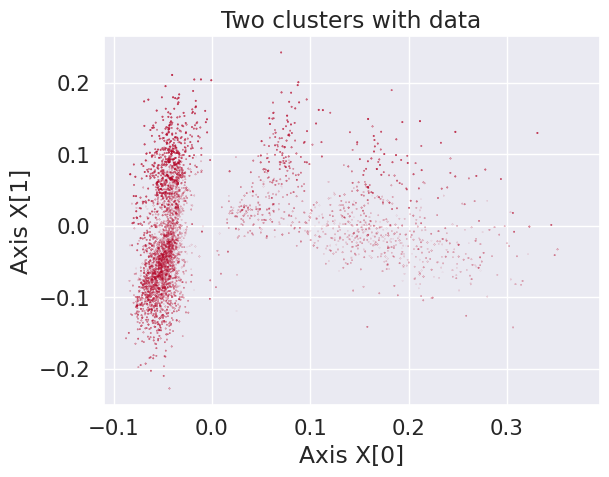

In [236]:
# Generate scatter plot for training data
colors = list(map(lambda x: '#3b4cc0' if x == 1 else '#b40426', labels))
plt.scatter(X[:,0], X[:,1],X[:,2], c=colors, marker="o", picker=True)
plt.title('Two clusters with data')
plt.xlabel('Axis X[0]')
plt.ylabel('Axis X[1]')
plt.show()

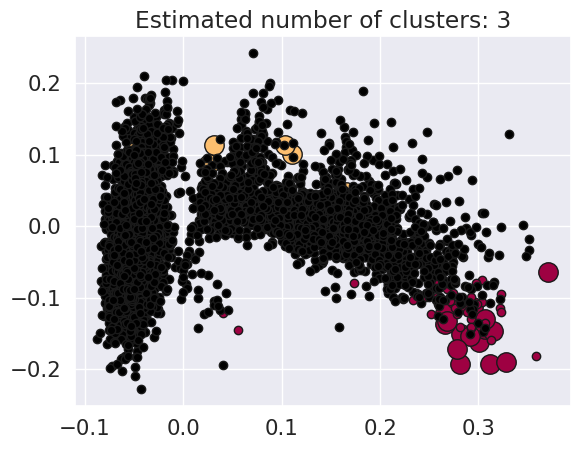

In [237]:
unique_labels = set(labels)
core_samples_mask = np.zeros_like(labels, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True

colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = labels == k

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=14,
    )

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )

plt.title(f"Estimated number of clusters: {no_clusters}")
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [238]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [239]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

I am considering **Silhouette Coefficient** or silhouette score which is a metric used to calculate the goodness of a clustering technique. Its value ranges from -1 to 1. 1: Means clusters are well apart from each other and clearly distinguished.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

Choosing **K- Means Clustering** because taking in consideration of good Silhouette score . even with n_clusters=4 score is good hence we are moving forward with K-means itself. 

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

..

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [240]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [241]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

1) There are 7787 rows and 12 columns in the dataset.

2) Netflix having content from year 1925 to 2021 

3) Netflix having 30.9% of TV Shows and 69.1% of Movies on its platform

4) Adults and Teens contents getting most of ratings

5) Both Movies & TV Shows productions/releases got boomed after year 2000 but Movies had more as compare to TV Shows.

6) Content after year 2015 increases more(almost doubled).

7) There is no such difference in releases for when compared monthwise.

8) International movies, dramas, comedy is prefred the most while TV Thriller, Classic & Cult TV , TV Shows are at last .

9) United States and India having more content with US having equal number of tv shows and movies while in India number of movies are more as compared to tvshows.

10) most of the content related to Life, Love , Family, Friend , World words.

11)Top TV Shows actors are from all around the world but Movies actors are all from India.

12) TFIDF Vectorization created 10000 dimensions. Then problem of dimensionality was treated by PCA(Principle Component Analysis) .3000 dimensions taken because of adding almost 80% of variance to it.

13) Implemented K-Means Clustering ,Agglomerative clustering , DB-Scan algorithms.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***